In [6]:
%matplotlib inline

import sys
#sys.path.insert(0, '/home/space/kai/src/Viscid/')
#sys.path.insert(0, '/home/space/dominic/Viscid')


import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import viscid
from viscid.plot import vpyplot as vlt
import h5py
import pandas as pd
import os
import scipy.constants as constants
viscid.calculator.evaluator.enabled = True

%config InlineBackend.figure_format = 'retina'


project_dir1="data_m100/"
project_dir4="data_m400/"

project_dirpair="data_pairplasma/"
project_jca = "data_jca/"




from scipy.signal import savgol_filter


In [7]:

run1 = project_dir1+"/pfd.xdmf"
run4 = project_dir4+"/pfd.xdmf"
runpair = project_dirpair+"/pfd.xdmf"
runjca = project_jca+"/pfd.xdmf"


t = 10
vf = viscid.load_file(run1, force_reload=True)
vf.activate_time(t)

f = viscid.load_file(run1, force_reload=True)
f.activate_time(t)


AttributeError: 'NoneType' object has no attribute 'activate_time'

In [3]:

vf = viscid.load_file(run1, force_reload = True)
vf.activate_time(5)

In [4]:
def make_plot(time, run, fldnames=["jy"], **kwargs):
    fig, ax = plt.subplots(len(fldnames), 1, figsize=(50,5*len(fldnames)))
    if not isinstance(ax, np.ndarray): ax = [ax]
    for i, fldname in enumerate(fldnames):
        # Hack around some inconsistencies with the field naming
        if run.endswith(".vpc"):
            map = {
                "bx_fc": "Magnetic Field X",
                "by_fc": "Magnetic Field Y",
                "bz_fc": "Magnetic Field Z",
                "jx": "Free Current Field X",
                "jy": "Free Current Field Y",
                
                "jz": "Free Current Field Z",
                "rho_nc": "Charge Density",
                "qn_nc_e": "Charge Density (ehydro)",
                "qn_nc_i": "Charge Density (Hhydro)",
                "jy_nc_e": "Current Density (ehydro) Y",
            }
        else:
            map = {
                "bx_fc": "hx_fc",
                "by_fc": "hy_fc",
                "bz_fc": "hz_fc",
                "qn_nc_e": "rho_nc_e",
                "qn_nc_i": "rho_nc_i",
            }
        vf = viscid.load_file(run, force_reload=True)
        vf.activate_time(time)
        _fldname = map[fldname] if fldname in map else fldname
        mid_val = 0
        
        vlt.plot(vf[_fldname], ax=ax[i], **kwargs);
        #plt.scatter(371, 0, color = 'k')
        #plt.scatter(280,0,color = 'k')
        #vlt.plot(vf["psi"],style="contour",levels=300,colors='k', ax=ax[i], **kwargs);

def plot(time, run, fldnames=["jy"], **kwargs):
    fig, ax = plt.subplots(len(fldnames), 1, figsize=(10,3.5*len(fldnames)))
    #if not isinstance(ax, np.ndarray): ax = [ax]
    for i, fldname in enumerate(fldnames):

        vf = viscid.load_file(run, force_reload=True)
        vf.activate_time(time)
        
        vlt.plot(vf[fldname], ax=ax[i], **kwargs);
        plt.xlabel(' ')
        plt.ylabel(' ')
        plt.xticks(fontsize = 13)
        plt.yticks(fontsize = 13)


        
        
def interp(a, pt):
    n = ((pt - xl)/dx).astype(int)
    return a[n[0],n[1],n[2]]

        
        

def Get_Fields(r):
    Ex, Ey, Ez = vf['ex_ec'], vf['ey_ec'], vf['ez_ec']
    Bx, By, Bz = vf['hx_fc'], vf['hy_fc'], vf['hz_fc']
    
    
    r = np.array([r[0],0,r[2]]) # This Resets the y position to zero
    Ex = interp(Ex,r)
    Ey = interp(Ey,r)
    Ez = interp(Ez,r)
    Bx = interp(Bx,r)
    By = interp(By,r)
    Bz = interp(Bz,r)
    
    E = np.array([Ex, Ey, Ez])
    B = np.array([Bx, By, Bz])
    
    return E, B


pts1 = [371,371,371,371,371,371,371,371,371,371,371,371,371,371,371,369,367,365,363,359,357,358,358,360,370,376,380,388,395,399,400]
# Right now this is specific to the mms_Kg211 run being used
def Em_Evolve():
    t = 0
    vf = viscid.load_file(run, force_reload=True)
    var = np.zeros([31,2])
    while t<31:
        vf.activate_time(t)
        E,B = Get_Fields(np.array([pts1[t],0,0]))
        var[t] = [t,E[1]] 
        
        t += 1
        
    return var






AttributeError: 'NoneType' object has no attribute 'activate_time'

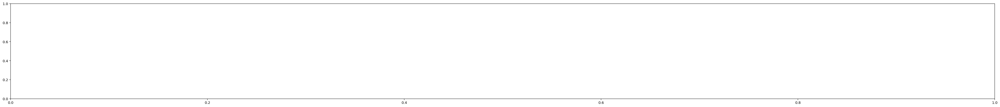

In [5]:
t = 13
while t < 17:
    make_plot(t, run1, ["ey_ec"],cmap = 'hot',symmetric=False, selection = "x=300f:400f, z=-15f:15f")
    t+=1

In [ ]:
JEe = "ej=(jx_nc_e*ex_ec + jy_nc_e*ey_ec + jz_nc_e*ez_ec)"
JEi = "ej=(jx_nc_i*ex_ec + jy_nc_i*ey_ec + jz_nc_i*ez_ec)"
JEex = "ejx=(jx_nc_e*ex_ec)"
JEey = "ejy=(jy_nc_e*ey_ec)"
JEez = "ejz=(jz_nc_e*ez_ec)"


JE = "ej=((jx_nc_e + jx_nc_i)*ex_ec + (jy_nc_e + jy_nc_i)*ey_ec + (jz_nc_e + jz_nc_i)*ez_ec)"
JEx = "ejx=((jx_nc_e + jx_nc_i)*ex_ec)"
JEy = "ejy=((jy_nc_e + jy_nc_i)*ey_ec)"
JEz = "ejz=((jz_nc_e + jz_nc_i)*ez_ec)"

# Parallel component of J and E (ind of sign of B)
JPar = "JPar = (jx_nc_e*hx_fc**2 + jy_nc_e*hy_fc**2 + jz_nc_e*hz_fc**2) / ((hx_fc**2 + hy_fc**2 + hz_fc**2)**1)"
EPar = "EPar = (ex_ec*hx_fc**2 + ey_ec*hy_fc**2 + ez_ec*hz_fc**2) / ((hx_fc**2 + hy_fc**2 + hz_fc**2)**1)"

EPar2 = "EPar2 = (ex_ec*hx_fc + ey_ec*hy_fc + ez_ec*hz_fc) / ((hx_fc**2 + hy_fc**2 + hz_fc**2)**0.5)"

EPerp = "EPerp = (ex_ec**2 + ey_ec**2 + ez_ec**2)**0.5 - (ex_ec*hx_fc**2 + ey_ec*hy_fc**2 + ez_ec*hz_fc**2) / ((hx_fc**2 + hy_fc**2 + hz_fc**2)**1) "


# Parallel contribution to J.E that does NOT depend on sign of mag field
JEPar = "JE Par =  (((jx_nc_e + jx_nc_i)*ex_ec)*(hx_fc**2) + ((jy_nc_e + jy_nc_i)*ey_ec)*(hy_fc**2) + ((jz_nc_e + jz_nc_i)*ez_ec)*(hz_fc**2)) / (hx_fc**2 + hy_fc**2 + hz_fc**2) "
JEPerp = "JE perp =  ((jx_nc_e + jx_nc_i)*ex_ec + (jy_nc_e + jy_nc_i)*jy_nc_e*ey_ec + (jz_nc_e + jz_nc_i)*jz_nc_e*ez_ec) - ((((jx_nc_e + 0*jx_nc_i)*ex_ec)*(hx_fc**2) + ((jy_nc_e + 0*jy_nc_i)*ey_ec)*(hy_fc**2) + ((jz_nc_e + 0*jz_nc_i)*ez_ec)*(hz_fc**2)) / (hx_fc**2 + hy_fc**2 + hz_fc**2)) "

JEPar2 = "JE Par = ((jx_nc_e*hx_fc**2 + jy_nc_e*hy_fc**2 + jz_nc_e*hz_fc**2) / ((hx_fc**2 + hy_fc**2 + hz_fc**2)**1)) * ((ex_ec*hx_fc**2 + ey_ec*hy_fc**2 + ez_ec*hz_fc**2) / ((hx_fc**2 + hy_fc**2 + hz_fc**2)**1))"

EyPrime_e = "Ey' electrons = ey_ec + (jz_nc_e * hx_fc)/rho_nc_e - (jx_nc_e * hz_fc)/rho_nc_e "

EyPrime_i = "Ey' ions = ey_ec + (jz_nc_i * hx_fc)/rho_nc_i - (jx_nc_i * hz_fc)/rho_nc_i "

ExPrime = "Ex' = ex_ec + (jy_nc_e * hz_fc)/rho_nc_e - (jz_nc_e * hy_fc)/rho_nc_e "

EzPrime = "Ez' = ez_ec + (jx_nc_e * hy_fc)/rho_nc_e - (jy_nc_e * hx_fc)/rho_nc_e "

EPsqd = "E'_sqrd = (ex_ec + (jy_nc_e * hz_fc)/rho_nc_e - (jz_nc_e * hy_fc)/rho_nc_e)**2 + ( ey_ec + (jz_nc_e * hx_fc)/rho_nc_e - (jx_nc_e * hz_fc)/rho_nc_e)**2 + (ez_ec + (jx_nc_e * hy_fc)/rho_nc_e - (jy_nc_e * hx_fc)/rho_nc_e)**2"

Bsqd = "Bsqd = hx_fc**2 + hy_fc**2 + hz_fc**2"




uB = "uB = (hx_fc)**2 + (hy_fc)**2 + (hz_fc)**2"
uE = "uE = (ex_ec)**2 + (ey_ec)**2 + (ez_ec)**2"

JEi = "ej=(jx_nc_i*ex_ec + jy_nc_i*ey_ec + jz_nc_i*ez_ec)"

n = "n = rho_nc_e  + rho_nc_i"
Tex = "Te = (txx_nc_e + 0*tyy_nc_e + 0*tzz_nc_e)/3"
Tey = "Te = (0*txx_nc_e + tyy_nc_e + 0*tzz_nc_e)/3"
Tez = "Te = (0*txx_nc_e + 0*tyy_nc_e + tzz_nc_e)/3"

Te_Par = "Te Parallel = (-1/rho_nc_e)*(hx_fc*txx_nc_e*hx_fc + hy_fc*tyy_nc_e*hy_fc + hz_fc*tzz_nc_e*hz_fc) / ((hx_fc**2 + hy_fc**2 + hz_fc**2))"
Te_Perp = "Te Perp = (-1/rho_nc_e)*(txx_nc_e + tyy_nc_e + tzz_nc_e) - (-1/rho_nc_e)*(hx_fc*txx_nc_e*hx_fc + hy_fc*tyy_nc_e*hy_fc + hz_fc*tzz_nc_e*hz_fc) / ((hx_fc**2 + hy_fc**2 + hz_fc**2))"

Te_ParPerp = "Te Par/TPerp - 1 = -1 + ((-1/rho_nc_e)*(hx_fc*txx_nc_e*hx_fc + hy_fc*tyy_nc_e*hy_fc + hz_fc*tzz_nc_e*hz_fc) / ((hx_fc**2 + hy_fc**2 + hz_fc**2))) / ((-1/rho_nc_e)*(txx_nc_e + tyy_nc_e + tzz_nc_e) - (-1/rho_nc_e)*(hx_fc*txx_nc_e*hx_fc + hy_fc*tyy_nc_e*hy_fc + hz_fc*tzz_nc_e*hz_fc) / ((hx_fc**2 + hy_fc**2 + hz_fc**2)))"
Ti_ParPerp = "Ti Par/TPerp - 1 = -1 + ((1/rho_nc_i)*(hx_fc*txx_nc_i*hx_fc + hy_fc*tyy_nc_i*hy_fc + hz_fc*tzz_nc_i*hz_fc) / ((hx_fc**2 + hy_fc**2 + hz_fc**2))) / ((1/rho_nc_i)*(txx_nc_i + tyy_nc_i + tzz_nc_i) - (1/rho_nc_i)*(hx_fc*txx_nc_i*hx_fc + hy_fc*tyy_nc_i*hy_fc + hz_fc*tzz_nc_i*hz_fc) / ((hx_fc**2 + hy_fc**2 + hz_fc**2)))"


Ti_Par = "Ti Parallel = (hx_fc*txx_nc_i*hx_fc + hy_fc*tyy_nc_i*hy_fc + hz_fc*tzz_nc_i*hz_fc) / ((hx_fc**2 + hy_fc**2 + hz_fc**2))"
Ti_Perp = "Ti Perp = (txx_nc_i + tyy_nc_i + tzz_nc_i) - (hx_fc*txx_nc_i*hx_fc + hy_fc*tyy_nc_i*hy_fc + hz_fc*tzz_nc_i*hz_fc) / ((hx_fc**2 + hy_fc**2 + hz_fc**2))"


Text(0.5, 0, ' ')

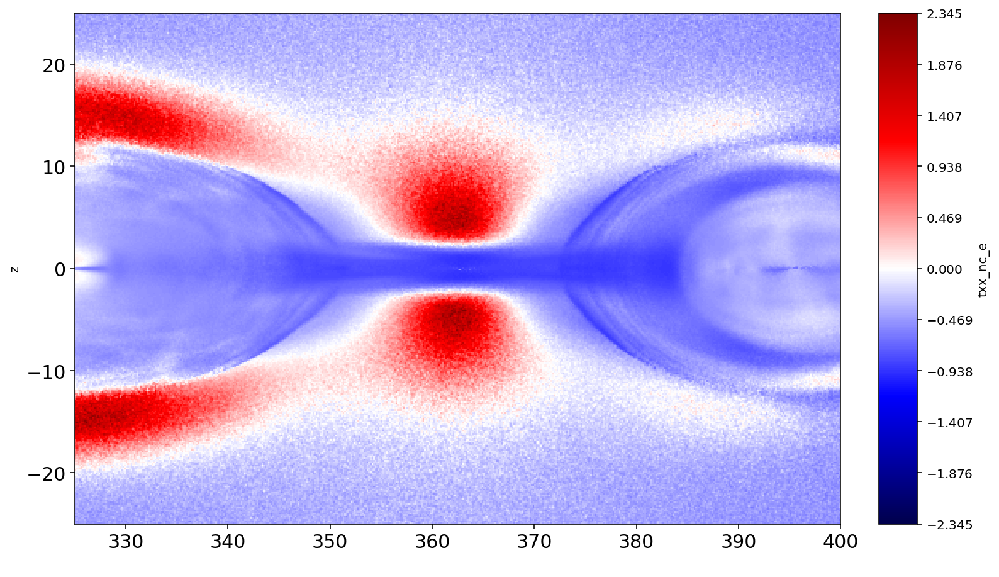

In [65]:
#Work in Progress
#Its working.  Should start making more parameters in this way. Much cleaner.
run = run1 #run1 or run4
t = 13 #timestep
# Need to load run, activate time, before field definitions
vf = viscid.load_file(run, force_reload=True)
vf.activate_time(t)
a = vf["hx_fc"]
x,y,z = a.crds.get_crds_nc()
dx,dy,dz = a.crds.get_dx()

# E&B Fields
Ex, Ey, Ez = vf["ex_ec"], vf["ey_ec"], vf["ez_ec"] 
Bx, By, Bz = vf["hx_fc"], vf["hy_fc"], vf["hz_fc"]

# Current densities
jx_e, jy_e, jz_e = vf["jx_nc_e"], vf["jy_nc_e"], vf["jz_nc_e"]
jx_i, jy_i, jz_i = vf["jx_nc_i"], vf["jy_nc_i"], vf["jz_nc_i"]

# Velocities
vex = jx_e / vf["rho_nc_e"]
vey = jy_e / vf["rho_nc_e"]
vez = jz_e / vf["rho_nc_e"]
vix = jx_i / vf["rho_nc_i"]
viy = jy_i / vf["rho_nc_i"]
viz = jz_i / vf["rho_nc_i"]

# Non-ideal E Fields
Ex_prime = Ex  + vey*Bz - vez*By
Ey_prime = Ey  + vez*Bx - vex*Bz
Ez_prime = Ez  + vex*By - vey*Bx

# Field Energy Densities (not sure what to put as factor, so can't compare magnitudes)
uE = (Ex**2 + Ey**2 + Ez**2)/2
uB = (Bx**2 + By**2 + Bz**2)/2
# ## Maybe 

# Number densities (related to charge density parameter)
ne, ni = vf["ne = -rho_nc_e"], vf["ni = rho_nc_i"]

# Temperatures
# Divide by three?  or no?
Tex, Tey, Tez = vf["txx_nc_e"], vf["tyy_nc_e"], vf["tzz_nc_e"]
Tix, Tiy, Tiz = vf["txx_nc_i"], vf["tyy_nc_i"], vf["tzz_nc_i"]
Te = (vf["txx_nc_e"] + vf["tyy_nc_e"] + vf["tzz_nc_e"])#/3
Ti = (vf["txx_nc_i"] + vf["tyy_nc_i"] + vf["tzz_nc_i"])#/3
Te_Par = (Tex*(Bx**2) +Tey*(By**2) + Tez*(Bz**2)) / (Bx**2 + By**2 + Bz**2) 
Ti_Par = (Tix*(Bx**2) +Tiy*(By**2) + Tiz*(Bz**2)) / (Bx**2 + By**2 + Bz**2) 
Te_Perp = Te - Te_Par 
Ti_Perp = Ti - Ti_Par 


# Poynting Flux
Sx = Ey*Bz - Ez*By
Sy = Ez*Bx - Ex*Bz
Sz = Ex*By - Ey*Bx

# J.E Contributions
JEx = (jx_e + jx_i)*Ex
JEy = (jy_e + jy_i)*Ey
JEz = (jz_e + jz_i)*Ez

# Poynting's Theorem Terms
divS = (Sx[2:,:,1:-1] - Sx[:-2,:,1:-1]) / (2*dx[0])  + (Sz[1:-1,:,2:] - Sz[1:-1,:,:-2]) / (2*dz[0])
JE = (JEx[1:-1,:,1:-1]) + (JEy[1:-1,:,1:-1]) + (JEz[1:-1,:,1:-1])
JE_alt = JEx + JEy + JEz
dudt = -JE - divS



#weird labeling issue, but fields seem to plot correctly...
fld = (Te_Par / Te_Perp) - 1
#fld = JE_alt

plt.figure(figsize=(12,12))
plt.subplot(1,1,1)
vlt.plot(fld, cmap = "seismic", symmetric = "True")
plt.axis("image")

if (run == run1):
    plt.xlim(325,400)
    plt.ylim(-25,25)
else:

    plt.xlim(740,810)
    plt.ylim(-40,40)


plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel(' ')

Text(0.5, 0, ' ')

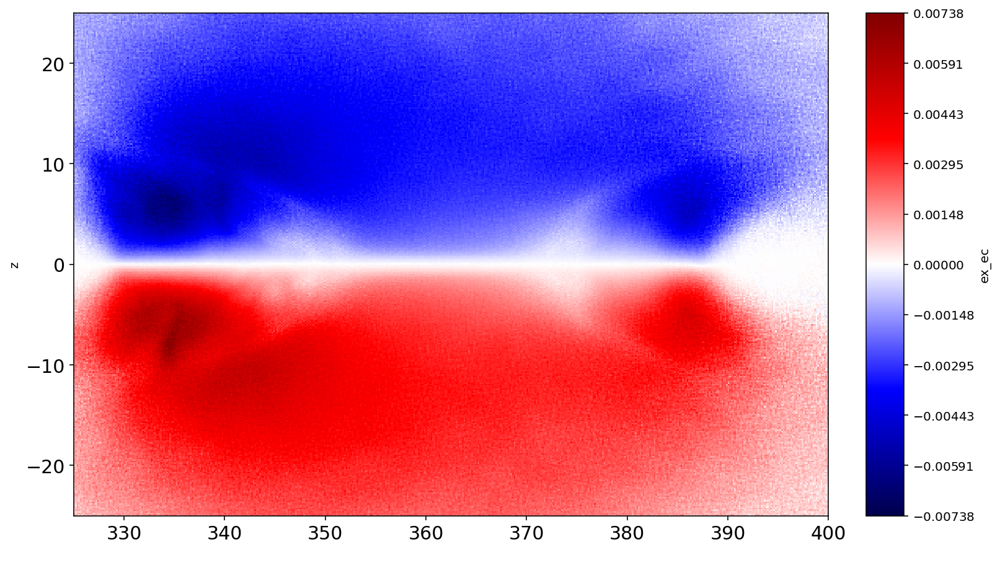

In [66]:
fld =Sz

plt.figure(figsize=(12,12))
plt.subplot(1,1,1)
vlt.plot(fld, cmap = "seismic", symmetric = "True")
plt.axis("image")

if (run == run1):
    plt.xlim(325,400)
    plt.ylim(-25,25)
else:

    plt.xlim(740,810)
    plt.ylim(-40,40)


plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel(' ')

/home/d0118dominic/.local/lib/python3.8/site-packages/viscid/plot/vpyplot.py:523: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("seismic").copy()
  p.get_cmap().set_bad(masknan)
/home/d0118dominic/.local/lib/python3.8/site-packages/viscid/plot/vpyplot.py:527: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("seismic").copy()
  p.get_cmap().set_bad('y')


Text(0.5, 0, ' ')

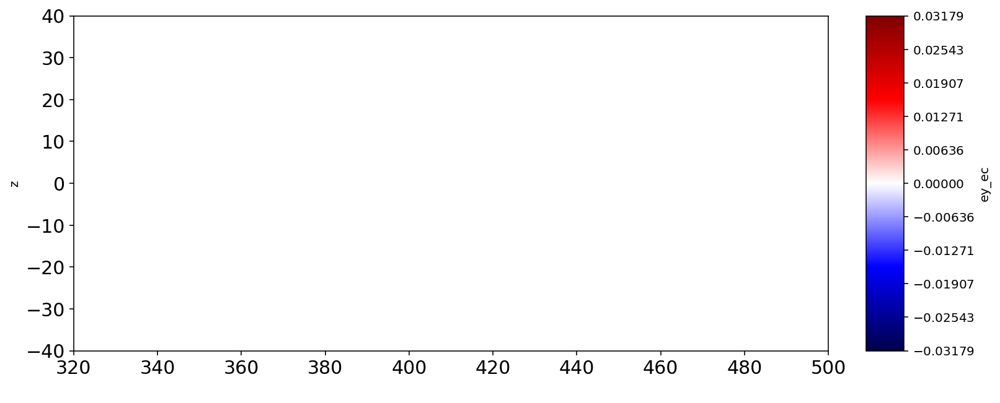

In [8]:
plt.figure(figsize=(12,12))
plt.subplot(1,1,1)
vlt.plot(Ey, cmap = "seismic", symmetric = "True")
plt.axis("image")
#plt.xlim(760,800)
plt.xlim(320,500)
plt.ylim(-40,40)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel(' ')

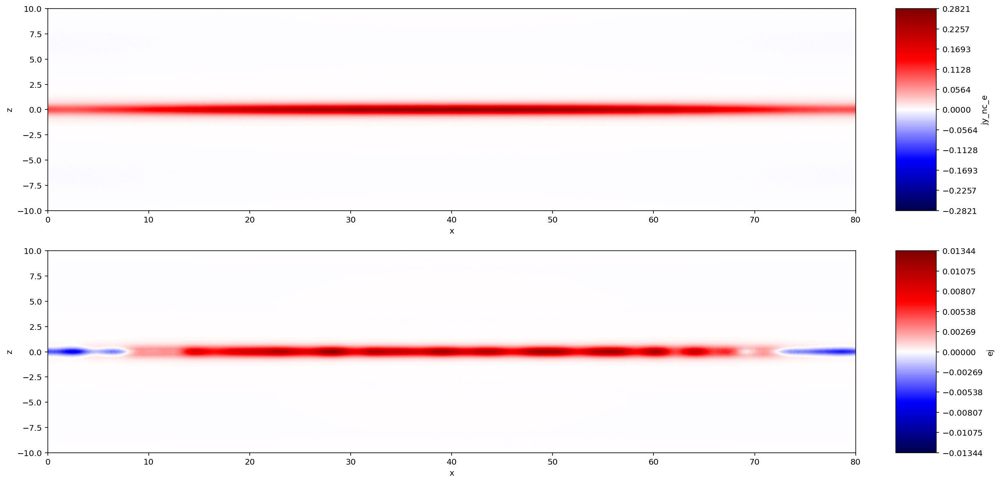

In [14]:



t = 16
fld = "jy_nc_e"
fld2 = JE

#make_plot(t, runpair, [fld, "jy_nc_e",JE],cmap = 'seismic',symmetric=True,selection = "x=30f:50f, z=-5f:5f")
make_plot(t, runpair, [fld, fld2],cmap = 'seismic',symmetric=True)
#make_plot(t, runjca,[fld,fld2],cmap = 'seismic',symmetric=True)

#make_plot(t, run1, [fld,fld2],cmap = 'seismic',symmetric=True)
#make_plot(t, run4, [fld],cmap = 'seismic',symmetric=True)
             
#for i in range(10):
#    make_plot(t + i, runpair, [JE],cmap = 'seismic',symmetric=True)
             

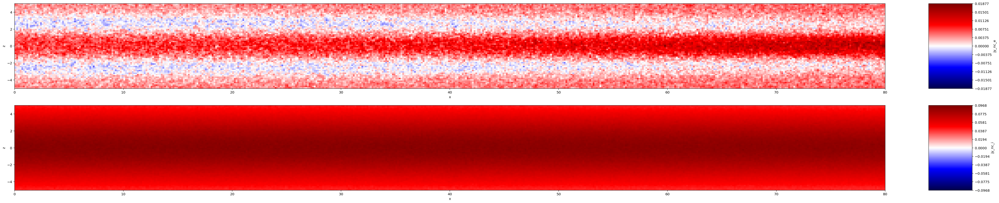

In [48]:
t = 0
fld = "hz_fc"

#make_plot(t, runpair, [fld, "jy_nc_e",JE],cmap = 'seismic',symmetric=True,selection = "x=30f:50f, z=-5f:5f")
make_plot(t, runpair, [fld],cmap = 'seismic',symmetric=True)
#make_plot(t, run1, [fld],cmap = 'seismic',symmetric=True)
#make_plot(t, run4, [fld],cmap = 'seismic',symmetric=True)
make_plot(t, runjca,[fld],cmap = 'seismic',symmetric=True)
             
#for i in range(10):
#    make_plot(t + i, runpair, [JE],cmap = 'seismic',symmetric=True)

In [41]:
selection1 = "x=345f:390f, z=-10f:10f"


t = 15

fld = JEy

#for i in range(6):
#    make_plot(t + i, run1, [ fld],cmap = 'seismic',symmetric=True,selection = selection1)



/home/d0118dominic/.local/lib/python3.8/site-packages/viscid/plot/vpyplot.py:523: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("seismic").copy()
  p.get_cmap().set_bad(masknan)
/home/d0118dominic/.local/lib/python3.8/site-packages/viscid/plot/vpyplot.py:527: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("seismic").copy()
  p.get_cmap().set_bad('y')


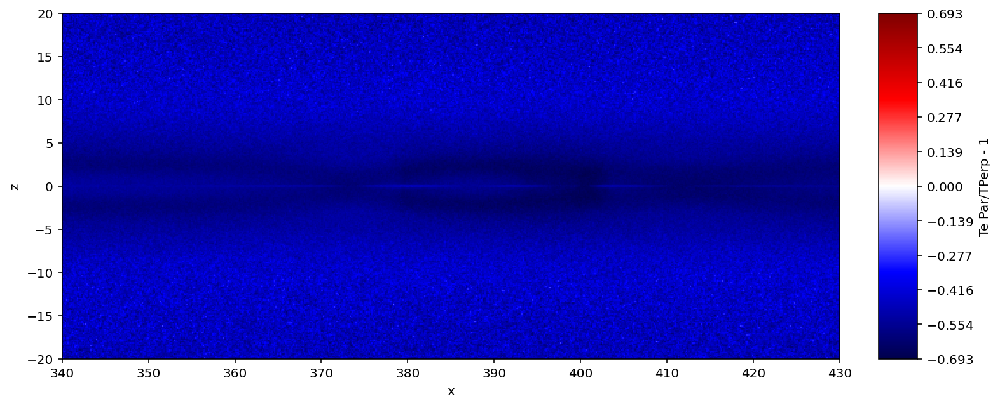

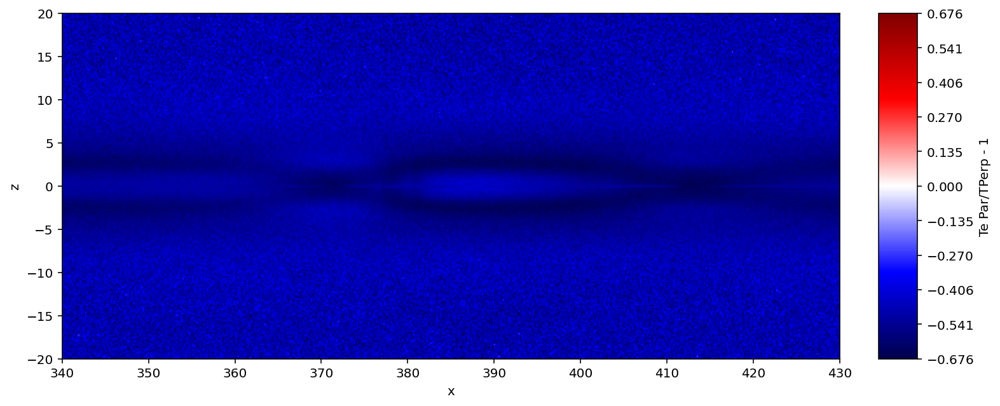

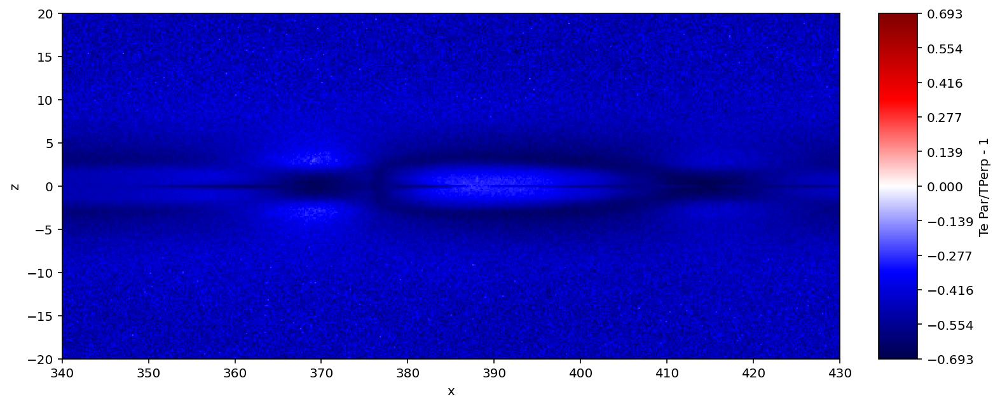

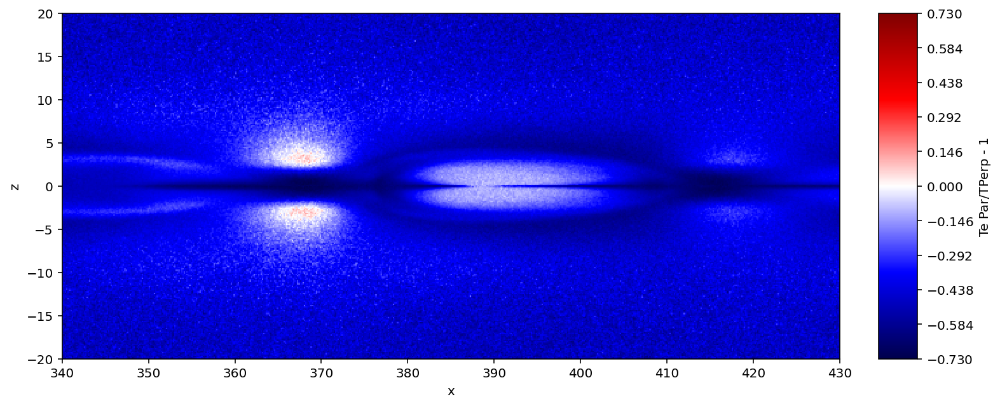

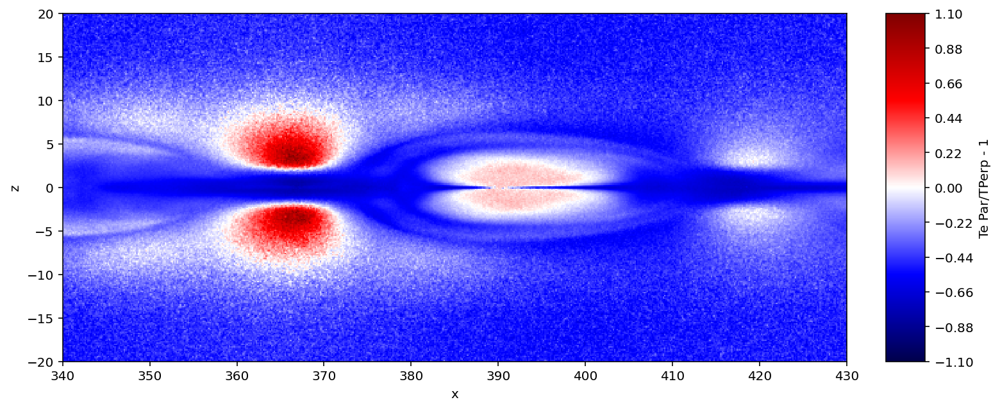

In [7]:
selection1 = "x=340f:430f, z=-20f:20f"


t = 12

fld = "n = -rho_nc_e"
for i in range(5):
    #make_plot(t + i, run1, [fld],cmap = 'gist_heat',symmetric=False,selection = selection1)
    make_plot(t + i, run1, [Te_ParPerp],cmap = 'seismic',symmetric=True,selection = selection1)


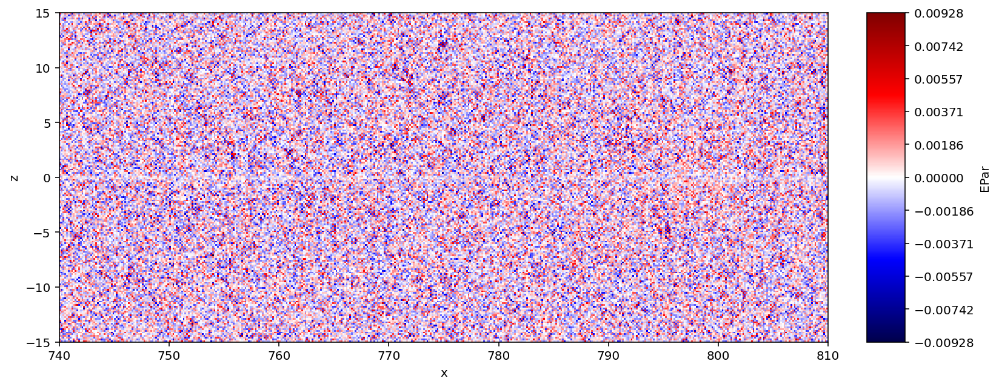

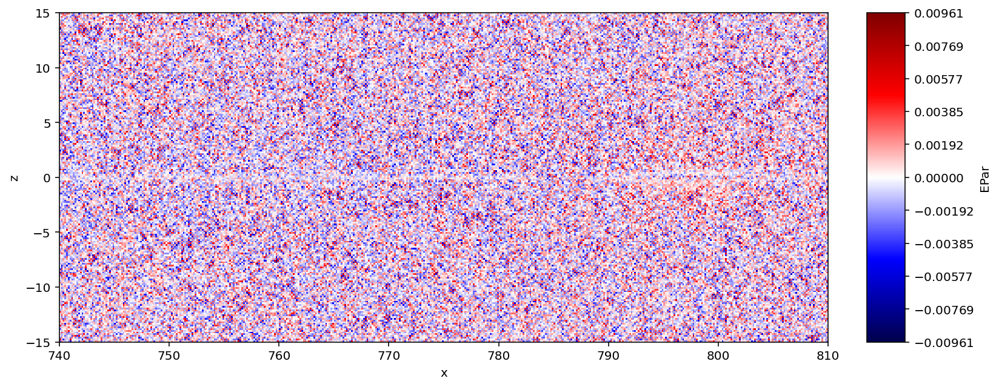

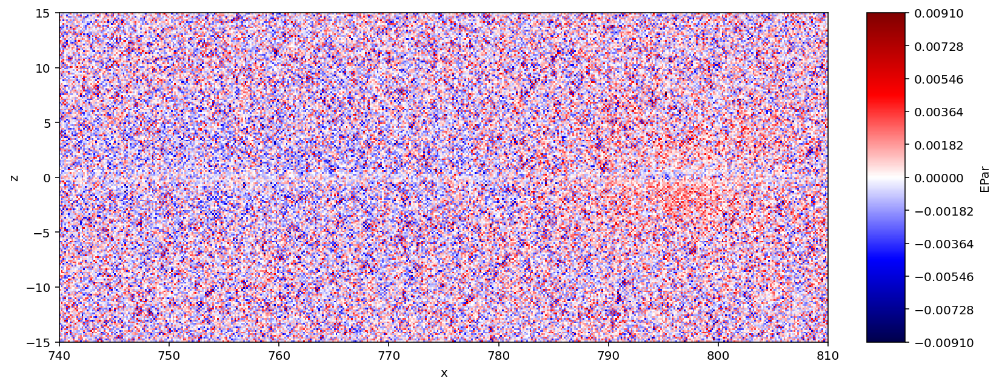

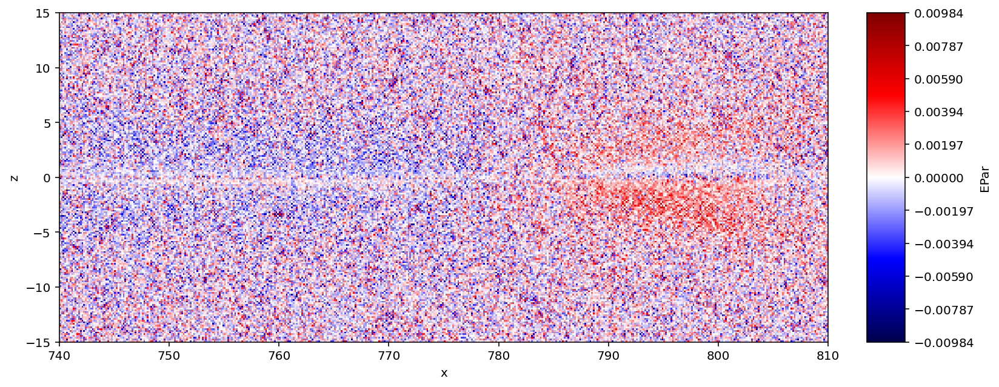

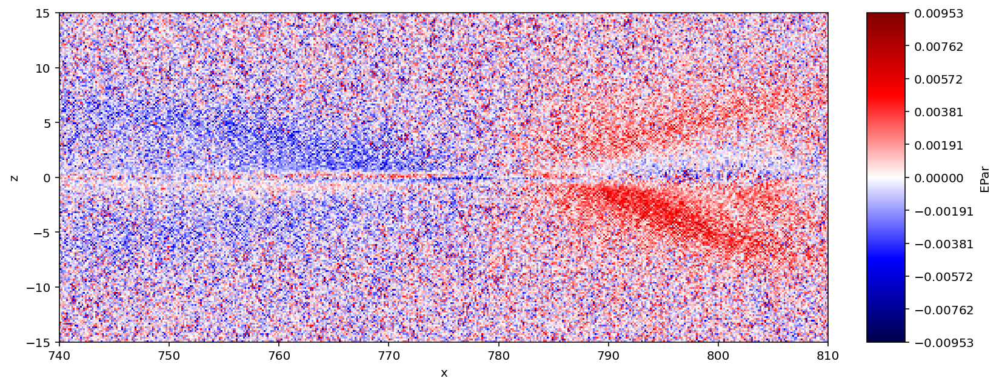

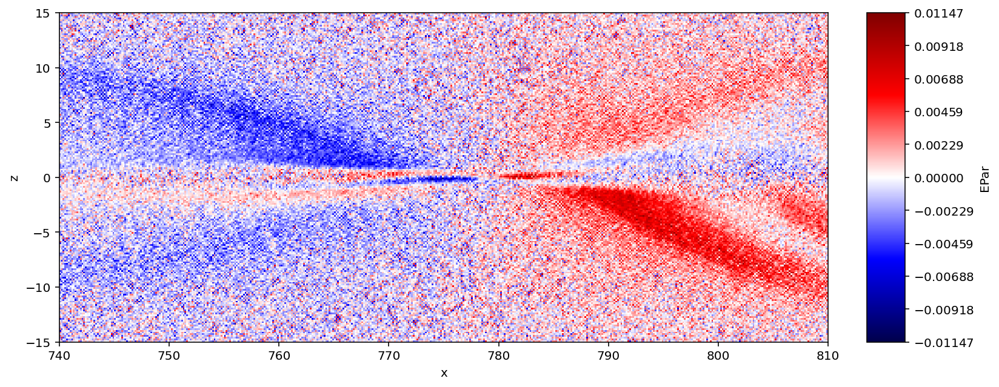

In [15]:
selection4 = "x=740f:810f, z=-15f:15f"


t = 10

fld = EPar

for i in range(6):
    make_plot(t + i, run4, [fld],cmap = 'seismic',symmetric=True,selection = selection4)


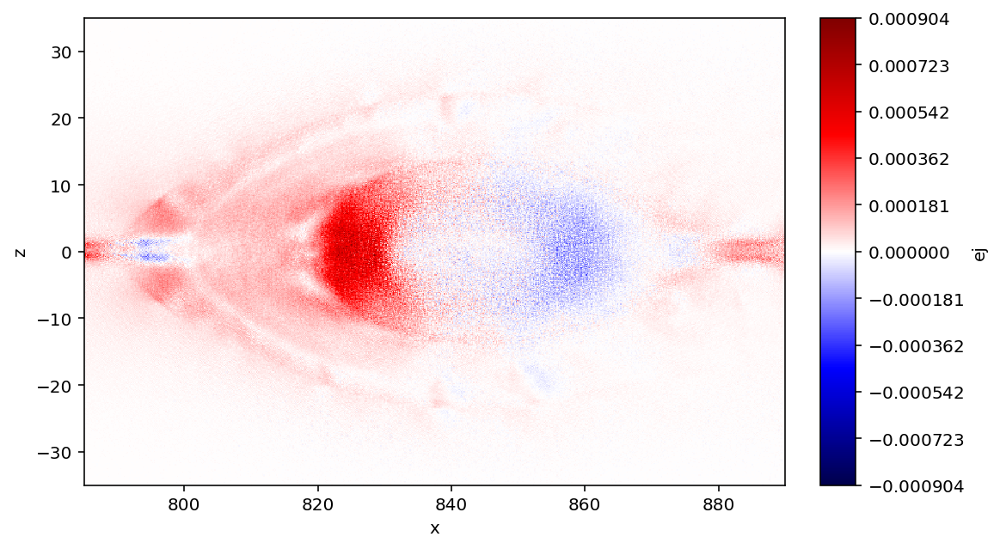

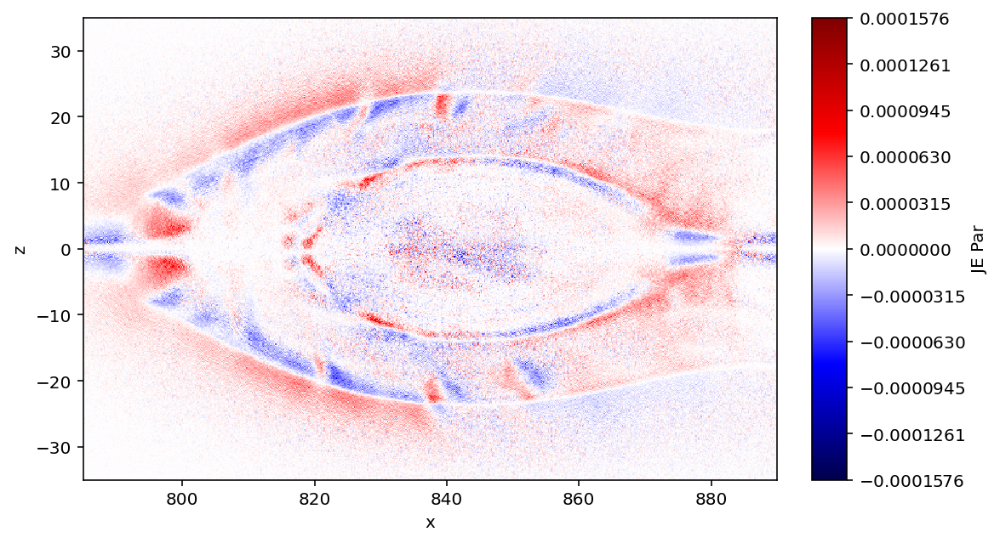

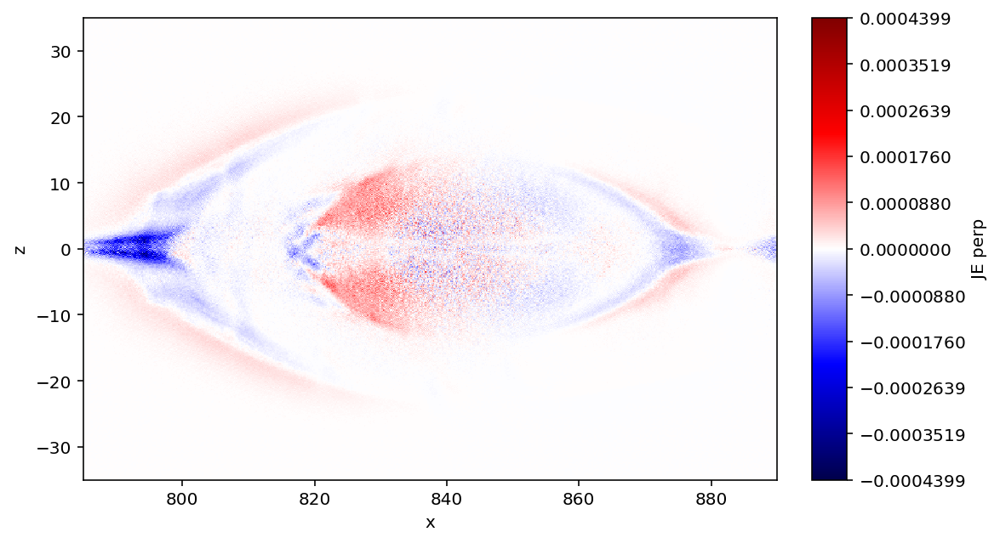

In [11]:


selection4 = "x=785f:890f, z=-35f:35f"  #max t = 18
selection1 = "x=340f:430f, z=-20f:20f"  #max t = 30


t = 17


fld1 = Ti_ParPerp
fld2 = Te_ParPerp
cmap = "seismic"
symmetric = True


make_plot(t, run4, [JE],cmap = cmap,symmetric = symmetric, selection=selection4)
make_plot(t, run4, [JEPar],cmap = cmap,symmetric = symmetric, selection=selection4)
make_plot(t, run4, [JEPerp],cmap = cmap,symmetric = symmetric, selection=selection4)






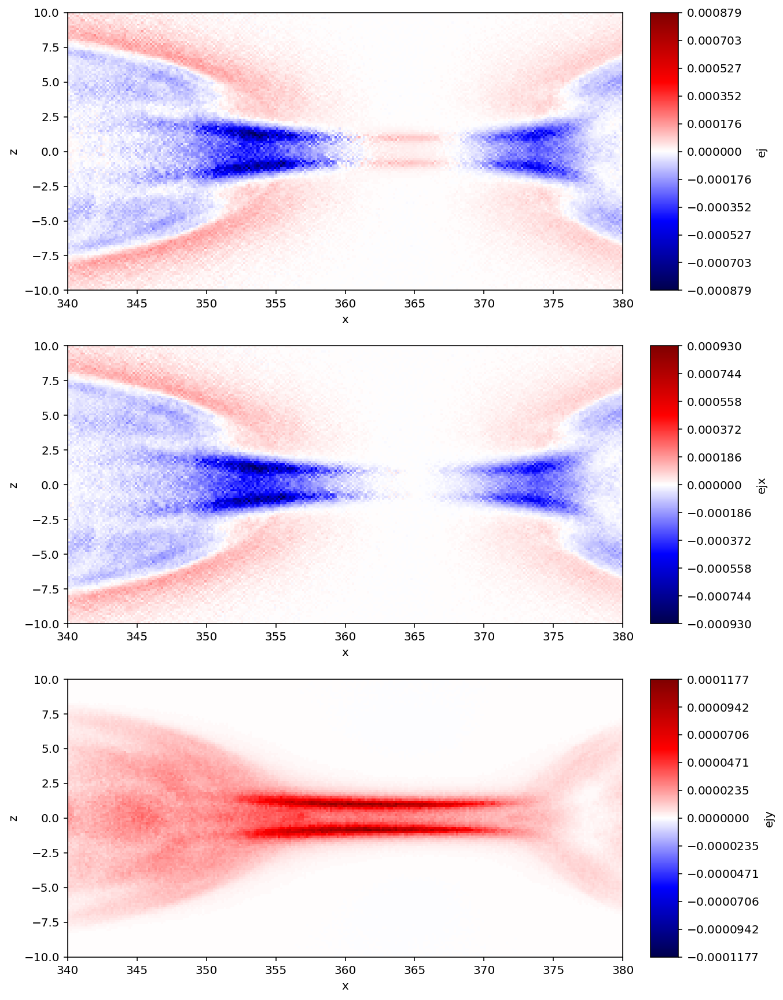

In [32]:
selection1 = "x=340f:380f, z=-10f:10f"  #max t = 30

make_plot(17, run1, [JE, JEx, JEy],cmap = cmap,symmetric = symmetric, selection=selection1)




/home/d0118dominic/.local/lib/python3.8/site-packages/viscid/plot/vpyplot.py:523: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("hot").copy()
  p.get_cmap().set_bad(masknan)
/home/d0118dominic/.local/lib/python3.8/site-packages/viscid/plot/vpyplot.py:527: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("hot").copy()
  p.get_cmap().set_bad('y')
/home/d0118dominic/.local/lib/python3.8/site-packages/viscid/plot/vpyplot.py:214: MatplotlibDeprecationWarning: 
The get_rows_columns function was deprecated in M

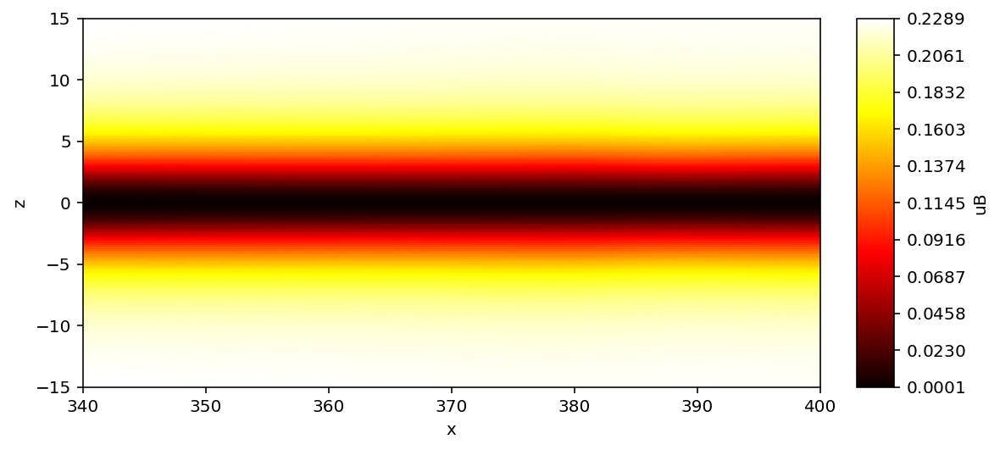

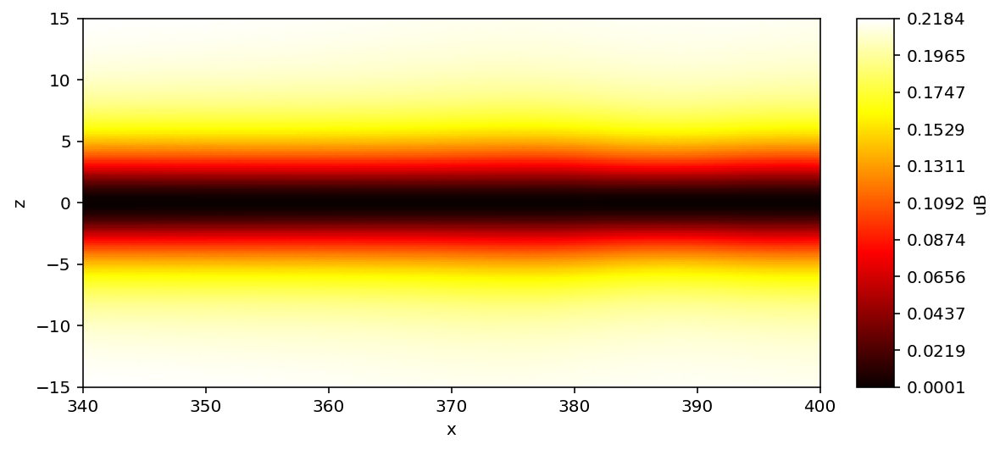

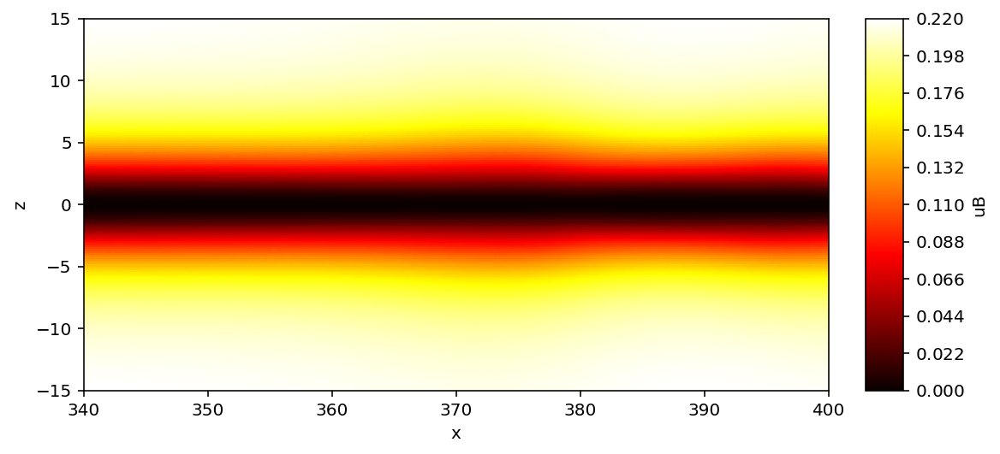

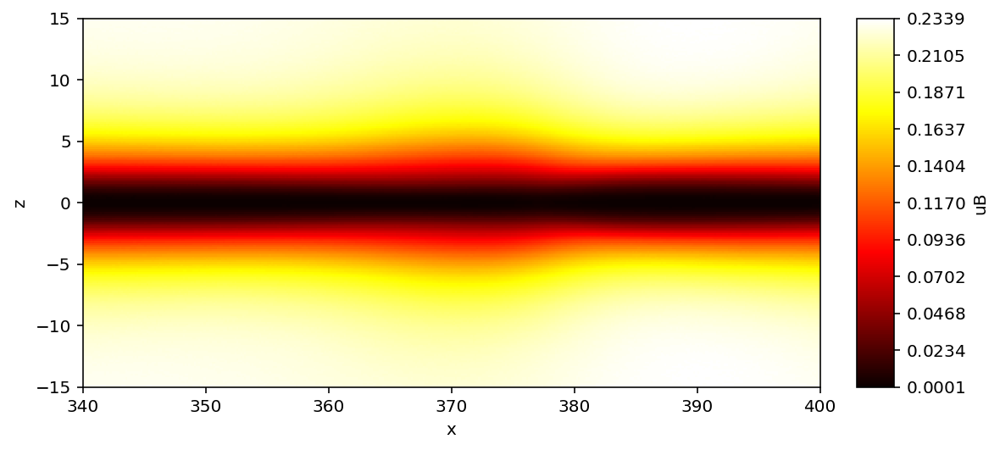

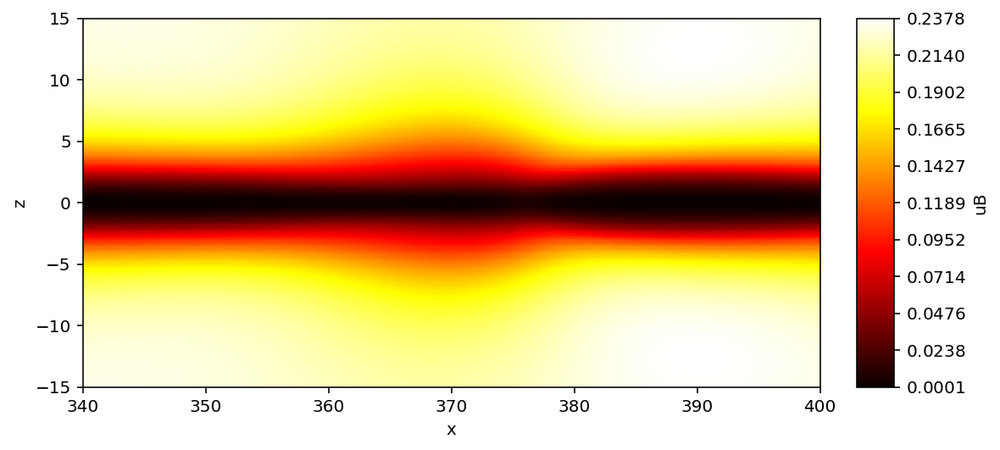

...

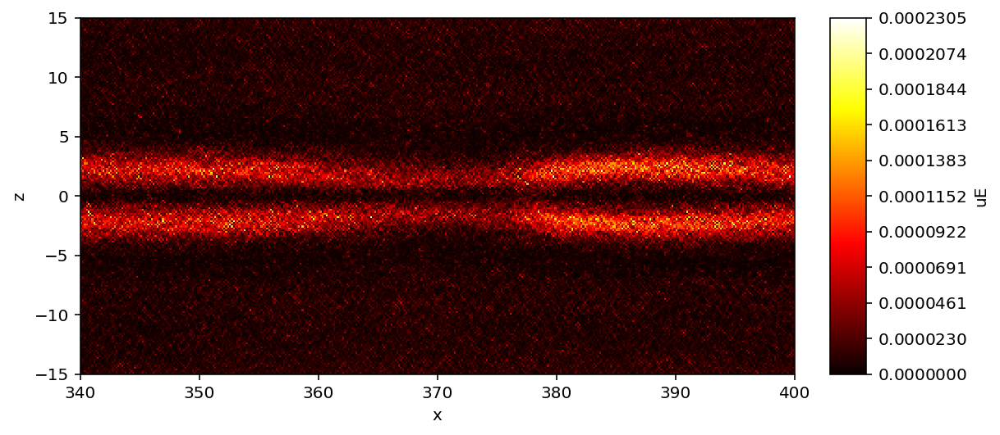

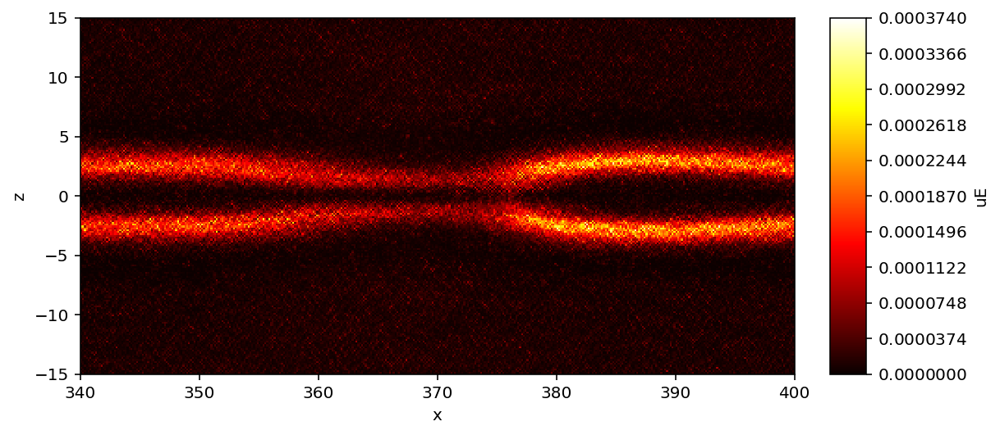

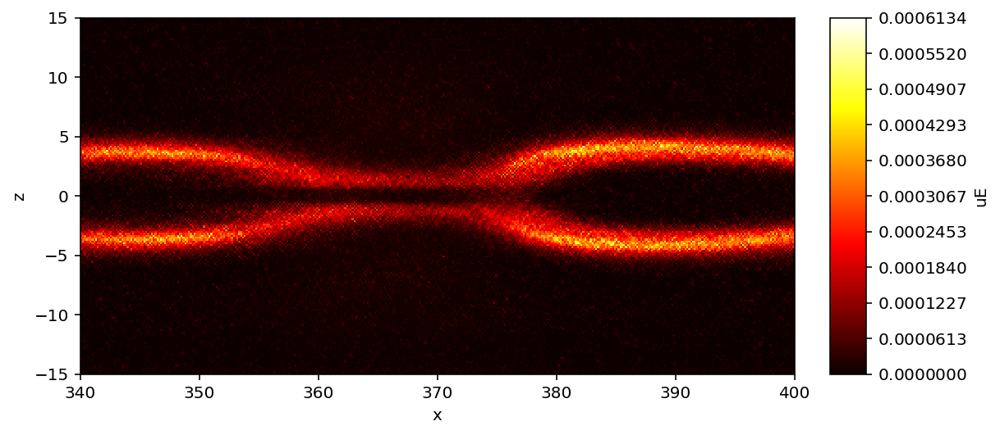

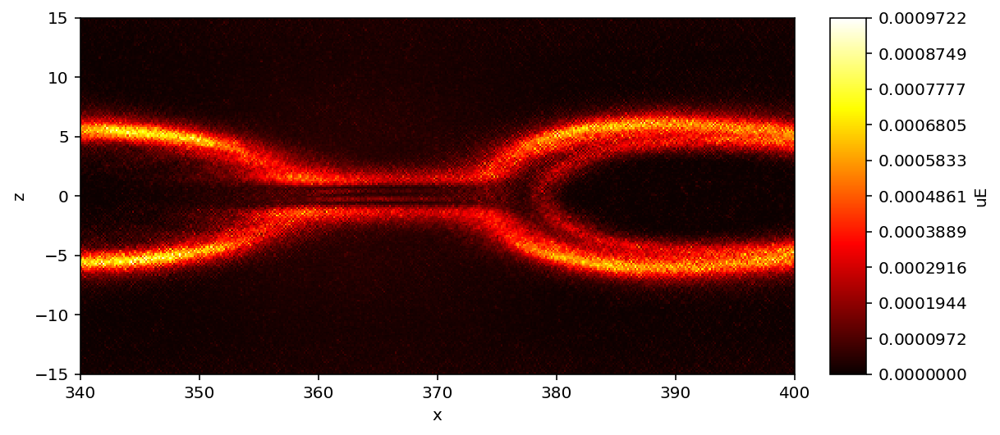

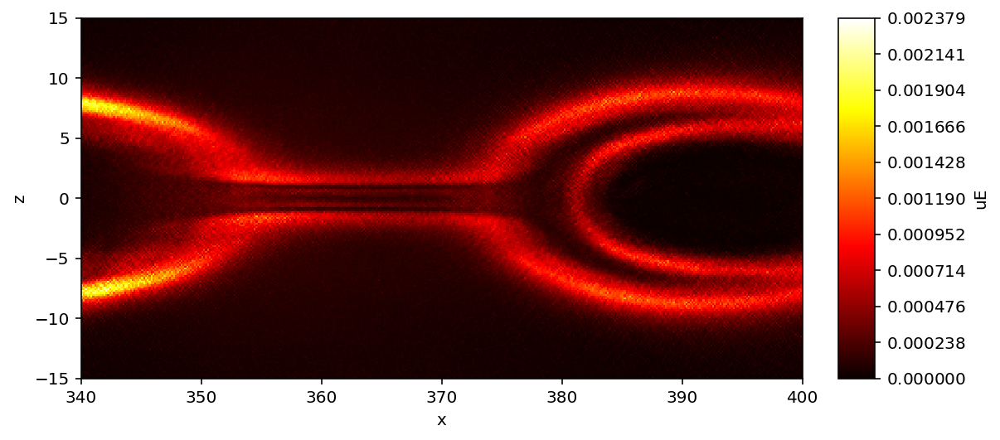

In [8]:

selection1 = "x=340f:400f, z=-15f:15f"  #max t = 30

t = 10



run = run1
selection = selection1
c = "hot"
make_plot(t, run, [uE],cmap = c,symmetric=False, selection=selection)
make_plot(t+1, run, [uE],cmap = c,symmetric=False, selection=selection)
make_plot(t+2, run, [uE],cmap = c,symmetric=False, selection=selection)
make_plot(t+3, run, [uE],cmap = c,symmetric=False, selection=selection)
make_plot(t+4, run, [uE],cmap = c,symmetric=False, selection=selection)
make_plot(t+5, run, [uE],cmap = c,symmetric=False, selection=selection)
make_plot(t+6, run, [uE],cmap = c,symmetric=False, selection=selection)
make_plot(t+7, run, [uE],cmap = c,symmetric=False, selection=selection)




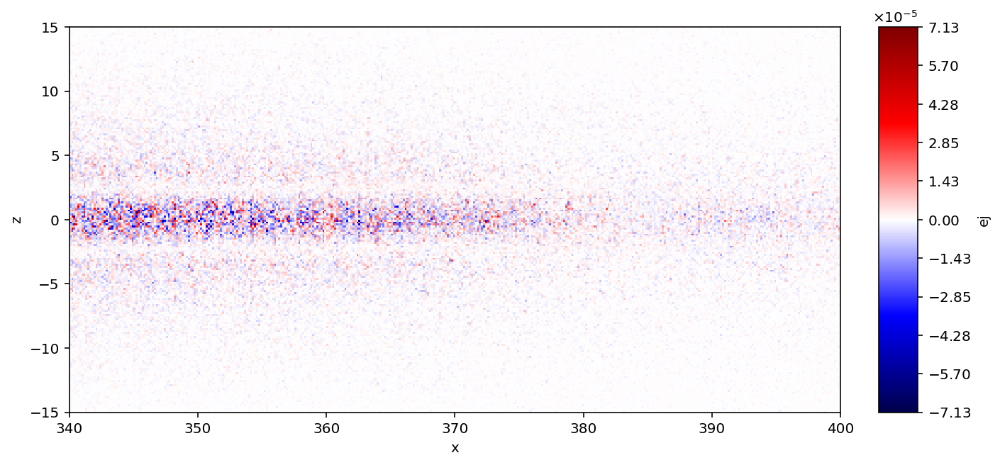

In [59]:
selection1 = "x=340f:400f, z=-15f:15f"  #max t = 30

t = 10



run = run1
selection = selection1
c = "seismic"
sym  = True

make_plot(t, run, [JE],cmap = c,symmetric=sym, selection=selection)


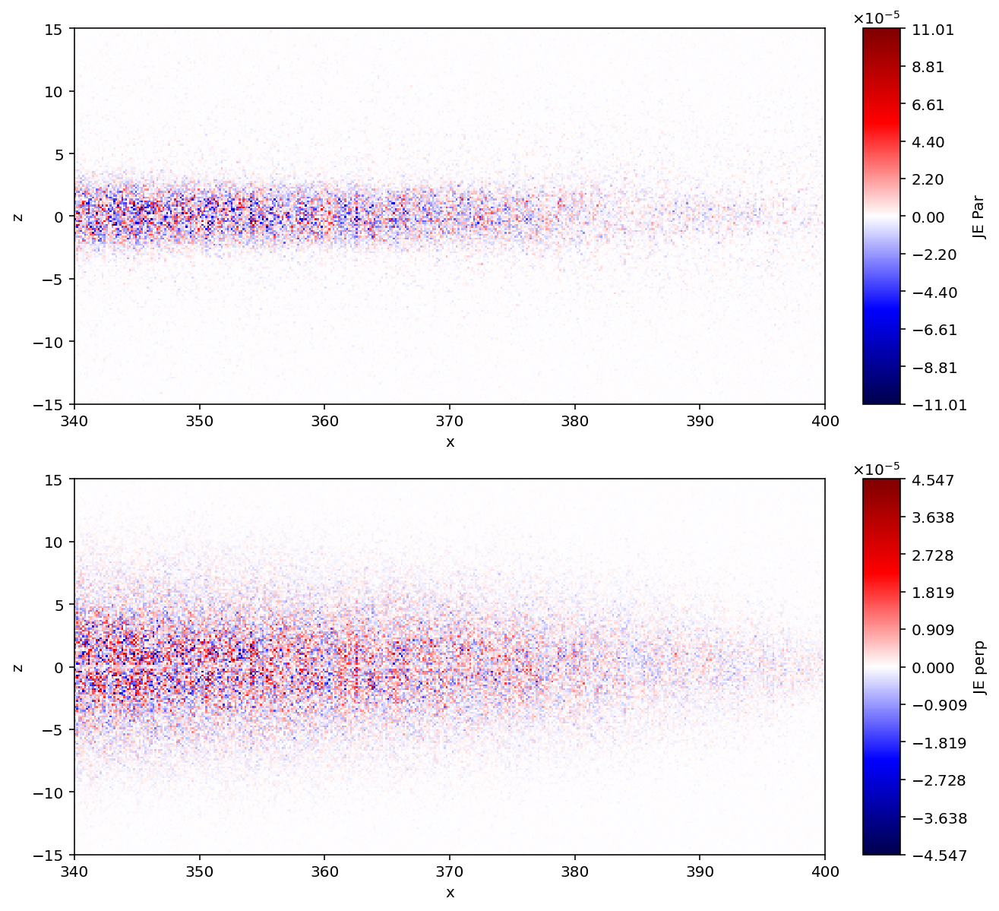

In [60]:
selection1 = "x=340f:400f, z=-15f:15f"  #max t = 30

t = 10



run = run1
selection = selection1
c = "seismic"
sym  = True

make_plot(t, run, [JEPar,JEPerp],cmap = c,symmetric=sym, selection=selection)


In [ ]:
t = 16
selection = "x=740f:815f, z=-15f:15f"
#selection = "x=720f:810f, z=-12f:12f"


JEe = "ej_e=(jx_nc_e*ex_ec + jy_nc_e*ey_ec + jz_nc_e*ez_ec)"

JPar = "JPar = (jx_nc_e*hx_fc + jy_nc_e*hy_fc + jz_nc_e*hz_fc) / ((hx_fc**2 + hy_fc**2 + hz_fc**2)**0.5)"
EPar = "EPar = (ex_ec*hx_fc + ey_ec*hy_fc + ez_ec*hz_fc) / ((hx_fc**2 + hy_fc**2 + hz_fc**2)**0.5)"

JE = "ej =((jx_nc_e+jx_nc_i)*ex_ec + (jy_nc_e+jy_nc_i)*ey_ec + (jz_nc_e+jz_nc_i)*ez_ec)"
JEx = "ejx =((jx_nc_e+jx_nc_i)*ex_ec)"
JEy = "ejy =((jy_nc_e+jy_nc_i)*ey_ec)"
JEz = "ejz =((jz_nc_e+jz_nc_i)*ez_ec)"

#JPar = "vx = jx_nc_e / rho_nc_e"

EyPrime = "Ey' = ey_ec + (jz_nc_e * hx_fc)/rho_nc_e - (jx_nc_e * hz_fc)/rho_nc_e "

m = "hot"
sym = False

make_plot(13, run, [Te_Par,Te_Perp],cmap = m, symmetric=sym,selection=selection)
make_plot(14, run, [Te_Par,Te_Perp],cmap = m,symmetric=sym, selection=selection)
make_plot(15, run, [Te_Par,Te_Perp],cmap = m,symmetric=sym, selection=selection)
make_plot(16, run, [Te_Par,Te_Perp],cmap = m,symmetric=sym, selection=selection)
make_plot(17, run, [Te_Par,Te_Perp],cmap = m,symmetric=sym, selection=selection)
make_plot(18, run, [Te_Par,Te_Perp],cmap = m,symmetric=sym, selection=selection)



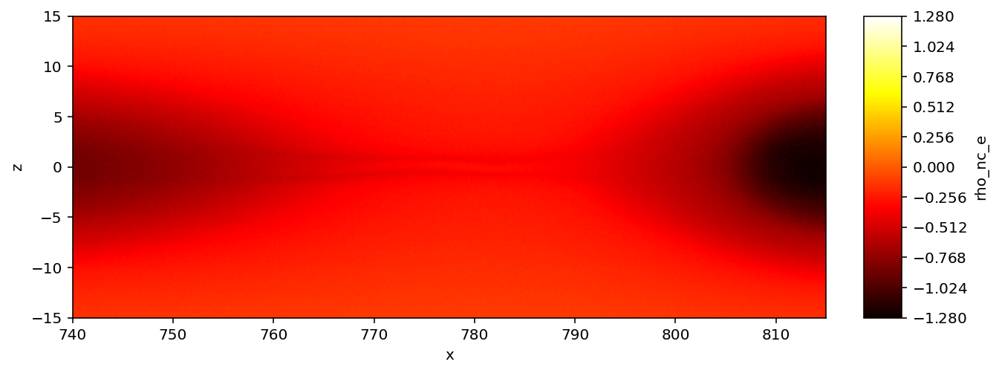

In [93]:
make_plot(15, run, ["rho_nc_e"],cmap = m,symmetric=True, selection=selection)


In [21]:
coords = []
i = 330
while i<381:
    coords.append(i)
    i += 1
#coords

In [10]:
# series of points in 1 timeframe.  330 to 390
n = 400

def Poynt_Space():
    du = [None]*n
    JdotE = [None]*n
    Div_S = [None]*n
    
    vf = viscid.load_file(run, force_reload=True)
    vf.activate_time(20)
    for i in range(n):
        
        a = vf["hx_fc"]
        x, y, z = a.crds.get_crds_nc()

        # Components of Poynting Flux
        Sx = vf["ey_ec"]*vf["hz_fc"] - vf["ez_ec"]*vf["hy_fc"]
        Sy = vf["ez_ec"]*vf["hx_fc"] - vf["ex_ec"]*vf["hz_fc"]
        Sz = vf["ex_ec"]*vf["hy_fc"] - vf["ey_ec"]*vf["hx_fc"]

        # Components of J.E
        JEx = (vf["jx_nc_e"] + vf["jx_nc_i"])*vf["ex_ec"]
        JEy = (vf["jy_nc_e"] + vf["jy_nc_i"])*vf["ey_ec"]
        JEz = (vf["jz_nc_e"] + vf["jz_nc_i"])*vf["ez_ec"]
        dx, dy, dz = a.crds.get_dx()

        # 2D Div(S)
        divS = (Sx[2:,:,1:-1] - Sx[:-2,:,1:-1]) / (2*dx[0])  + (Sz[1:-1,:,2:] - Sz[1:-1,:,:-2]) / (2*dz[0])
        
        JE = (JEx[1:-1,:,1:-1]) + (JEy[1:-1,:,1:-1]) + (JEz[1:-1,:,1:-1])
        


        JdotE[i] = viscid.interp(JE, np.array([coords[i], 0, 0]))
        Div_S[i] = viscid.interp(divS, np.array([coords[i], 0, 0]))
        du[i] = - JdotE[i] - Div_S[i]
        
    return JdotE, Div_S, du



#J_E,D_S,D_U = Poynt_Space()

In [23]:
#plt.plot(J_E, color = 'red', label = 'J.E')
#plt.plot(D_S, color = 'blue', label = 'Div_S')
#plt.plot(D_U, color = 'black', label = 'du/dt')
#plt.axhline(y=0, color = 'k', linestyle = '--')
#plt.ylabel('Terms')
#plt.xlabel('x')


In [12]:
#Evaluates the terms in Poynting's theorem at different coordinates for each timestep so we can follow the EDR as the xline evolves

pts1 = [371,371,371,371,371,371,371,371,371,371,371,371,371,371,371,369,367,365,363,359,357,358,358,360,370,376,380,388,395,399,400]
pts2 = [380,380,380,380,380,380,380,380,380,380,380,380,380,380,376,375,374,374,374,372,372,375,380,385,390,397,405,412,425,440,450]


def Poynts_Evolve(pts):
    du = [None]*30
    JdotE = [None]*30
    Div_S = [None]*30
    for t in range(30):
        
        vf = viscid.load_file(run4, force_reload=True)
        vf.activate_time(t)
        a = vf["hx_fc"]
        x, y, z = a.crds.get_crds_nc()

        # Components of Poynting Flux
        Sx = vf["ey_ec"]*vf["hz_fc"] - vf["ez_ec"]*vf["hy_fc"]
        Sy = vf["ez_ec"]*vf["hx_fc"] - vf["ex_ec"]*vf["hz_fc"]
        Sz = vf["ex_ec"]*vf["hy_fc"] - vf["ey_ec"]*vf["hx_fc"]

        # Components of J.E
        JEx = (vf["jx_nc_e"] + vf["jx_nc_i"])*vf["ex_ec"]
        JEy = (vf["jy_nc_e"] + vf["jy_nc_i"])*vf["ey_ec"]
        JEz = (vf["jz_nc_e"] + vf["jz_nc_i"])*vf["ez_ec"]
        dx, dy, dz = a.crds.get_dx()

        # 2D Div(S)
        divS = (Sx[2:,:,1:-1] - Sx[:-2,:,1:-1]) / (2*dx[0])  + (Sz[1:-1,:,2:] - Sz[1:-1,:,:-2]) / (2*dz[0])
        
        JE = (JEx[1:-1,:,1:-1]) + (JEy[1:-1,:,1:-1]) + (JEz[1:-1,:,1:-1])
        


        JdotE[t] = viscid.interp(JE, np.array([pts[t],0,0]))
        Div_S[t] = viscid.interp(divS, np.array([pts[t],0,0]))
        du[t] = - JdotE[t] - Div_S[t]
        
    return JdotE, Div_S, du


#pt = np.array([340, 0, 0])
JdotE_cs,Div_S_cs,du_cs = Poynts_Evolve(pts1)

#JdotE_edg,Div_S_edg,du_edg = Poynts_Evolve(pts2)


IndexError: list index out of range

In [8]:
# Evaluates the out-of-plane electric field at the same coordinates that were used for the Poynting's theorem code above

def EEE_Evolve(pts):
    Ey = [None]*30
    ERx = [None]*30
    for t in range(30):
        
        vf = viscid.load_file(run, force_reload=True)
        vf.activate_time(t)
        a = vf["hx_fc"]
        x, y, z = a.crds.get_crds_nc()

        # Out-of-plane Efield Component
        Ey = vf["ey_ec"]
        
        
        
        ERx[t] = viscid.interp(Ey, np.array([pts[t],0,0]))
       
    return ERx


#pt = np.array([340, 0, 0])

ERx = EEE_Evolve(pts1)

Text(0.5, 0, 't')

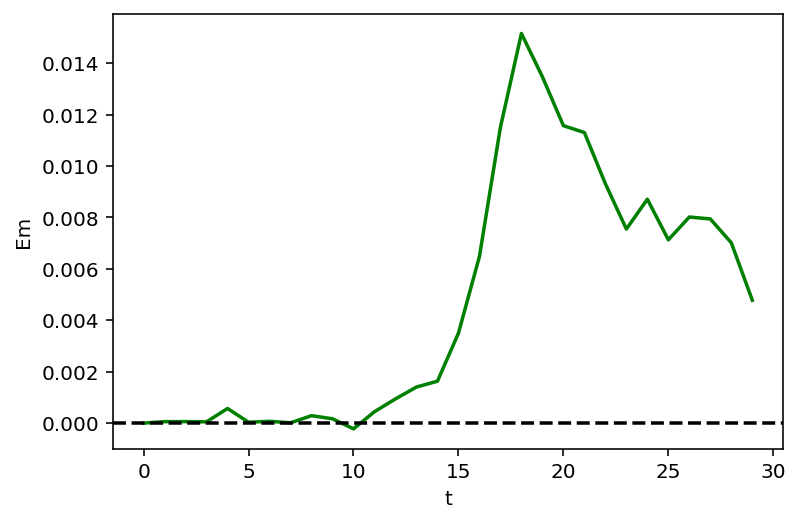

In [9]:
# Plot out-of-plane Efield over time
plt.plot(ERx, color = 'g')
plt.axhline(y=0, color = 'k',linestyle = '--')
plt.ylabel('Em')
plt.xlabel('t')

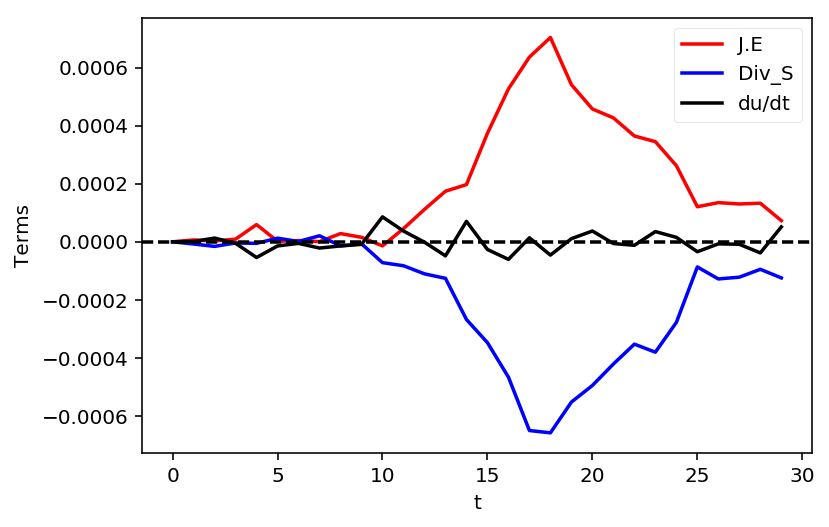

In [42]:
#Plot Poynting's theorem terms over time

plt.plot(JdotE_cs, color = 'red', label = 'J.E')
plt.plot(Div_S_cs, color = 'blue', label = 'Div_S')
plt.plot(du_cs, color = 'black', label = 'du/dt')
plt.axhline(y=0, color = 'k', linestyle = '--')

plt.xlabel('t')
plt.ylabel('Magnitude (Current Sheet)')

plt.ylabel('Terms')
plt.xlabel('t')

plt.legend()

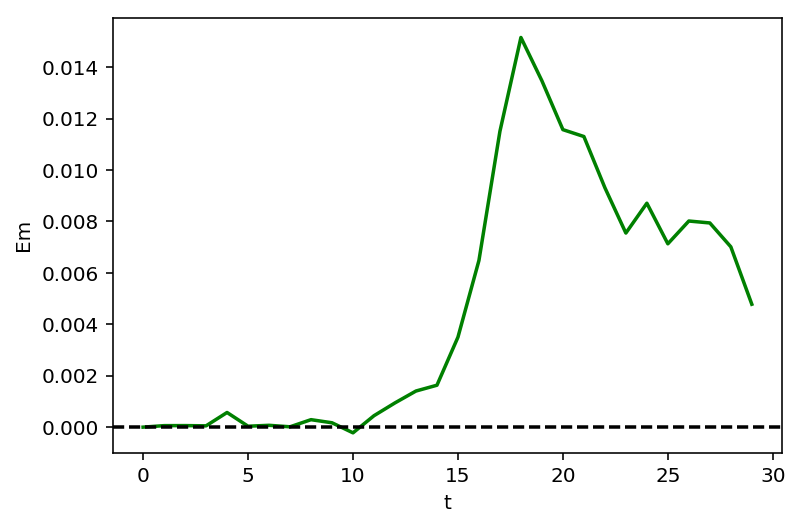

In [41]:
# Plot out-of-plane Efield over time
plt.plot(ERx, color = 'g')
plt.axhline(y=0, color = 'k',linestyle = '--')
plt.ylabel('Em')
plt.xlabel('t')

In [ ]:
# Modified code for Poynting's theorem

#Ignore.  Not used in submitted manuscript.  Anything below this cell is not a part of the submitted manuscript

# Need to draw a path at one timestep




t = 22


def Poynt_Path(t):
    vf = viscid.load_file(run, force_reload=True)
    vf.activate_time(t)
    
    du = [None]*67
    JdotE = [None]*67
    Div_S = [None]*67
    
    
    a = vf["hx_fc"]
    x, y, z = a.crds.get_crds_nc()

    # Components of Poynting Flux
    # Components of Poynting Flux
    Sx = vf["ey_ec"]*vf["hz_fc"] - vf["ez_ec"]*vf["hy_fc"]
    Sy = vf["ez_ec"]*vf["hx_fc"] - vf["ex_ec"]*vf["hz_fc"]
    Sz = vf["ex_ec"]*vf["hy_fc"] - vf["ey_ec"]*vf["hx_fc"]

    # Components of J.E
    JEx = (vf["jx_nc_e"] + vf["jx_nc_i"])*vf["ex_ec"]
    JEy = (vf["jy_nc_e"] + vf["jy_nc_i"])*vf["ey_ec"]
    JEz = (vf["jz_nc_e"] + vf["jz_nc_i"])*vf["ez_ec"]
    dx, dy, dz = a.crds.get_dx()

    # 2D Div(S)
    divS = (Sx[2:,:,1:-1] - Sx[:-2,:,1:-1]) / (2*dx[0])  + (Sz[1:-1,:,2:] - Sz[1:-1,:,:-2]) / (2*dz[0])
        
    JE = (JEx[1:-1,:,1:-1]) + (JEy[1:-1,:,1:-1]) + (JEz[1:-1,:,1:-1])    
    
    
    for i in range(67):
        
        JdotE[i] = viscid.interp(JE, coords[i])
        Div_S[i] = viscid.interp(divS, coords[i])
        du[i] = - JdotE[i] - Div_S[i]
        
    return JdotE, Div_S, du


#pt = np.array([365, 0, 0])
#JdotE,Div_S,du = Poynt_Path(t)

In [36]:
#x = 365
#y = 0
#z = 0
    
#xl = np.array([0, 0, -100])
#dx = np.array([crd[0] for crd in Sx.crds.get_dx()])
#pt = np.array([x, y, z])
#n = ((pt - xl)/dx).astype(int)
#print(xl, dx, pt, n)
#test = interp(Sx, np.array([x,y,z]))
#test2 = viscid.interp(Sx, [pt])
#test, test2[0]

In [49]:
#vlt.plot(JE)

#X = np.arange(Sx.shape[0])*dx[0]
#Z = np.arange(Sx.shape[2])*dx[2]
#plt.pcolormesh(X, Z, Sx.data[:,0,:].T)
#plt.colorbar()

In [37]:
#E_M = Em_Evolve()
#plt.plot(E_M[:,0],E_M[:,1])
#plt.axhline(y=0, color = 'k',linestyle = '--')
#plt.ylabel('E_M')
#plt.xlabel('t')

In [39]:
#plt.plot(JdotE, color = 'red', label = 'J.E')
#plt.plot(Div_S, color = 'blue', label = 'Div_S')
#plt.plot(du, color = 'black', label = 'du/dt')
#plt.axhline(y=0, color = 'k', linestyle = '--')

#plt.xlabel('t')
#plt.ylabel('Magnitude')

#plt.ylabel('Terms')
#plt.xlabel('x')


#plt.plot( 'x', 'y1', data=df, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
#plt.plot( 'x', 'y2', data=df, marker='', color='olive', linewidth=2)
#plt.plot( 'x', 'y3', data=df, marker='', color='olive', linewidth=2, linestyle='dashed', label="toto")
#plt.legend()

